<a href="https://colab.research.google.com/github/hillahalevi/Big-data/blob/main/Copy_of_HW_3_Version_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework Assignment 3

Using the [Seattle Library Collection Inventory Dataset](https://www.kaggle.com/city-of-seattle/seattle-library-collection-inventory#library-collection-inventory.csv) and TuriCreate please, answer the following questions:

Important Note: You can use a reltaviely small subset of the big dataset.

setup

In [ ]:
# see more details in the course first lecture
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle 

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"hilla464","key":"2ebc2419b9fbaf4902445878b377659b"}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install vaex
# Creating a dataset directory

!mkdir ./datasets
!mkdir ./datasets/library-collection

# download the dataset from Kaggle and unzip it
!kaggle datasets download city-of-seattle/seattle-library-collection-inventory  -f library-collection-inventory.csv -p ./datasets/library-collection/
!unzip ./datasets/library-collection/*.zip  -d ./datasets/library-collection
!ls ./datasets/library-collection

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 43.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 46.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 34.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 3.9 

In [ ]:
import vaex
rows = 1000000
df = vaex.read_csv("./datasets/library-collection/library-collection-inventory.csv", convert=True, progress=True,nrows= rows)

Converting csv to chunk files
Saved chunk #0 to ./datasets/library-collection/library-collection-inventory.csv_chunk_0.hdf5


**Question 1:** Using Vaex, write a function that returns the most popular book in each subject. Use it to find the most popular book in
    the _Mystery Fiction_ subject (15pt)

In [ ]:
# Define a function that takes a subject as input and returns the most popular book in that subject
def most_popular_book(subject,df):
    # drop the rows with NaN values in the 'Subjects' column
    cleaned = df[df['Subjects'].notna()]
    print("cleaned " +str(cleaned.shape))

    # split the 'Subjects' column into a list of strings
    cleaned['Subjects'] = cleaned['Subjects'].str.split(',')

    # Convert the Vaex DataFrame to a Pandas DataFrame
    pandas_df = cleaned.to_pandas_df()

    # explode the 'Subjects' column into separate rows
    splitted = pandas_df.explode('Subjects')
    print("splitted " + str(splitted.shape))

    # Filter the DataFrame to keep only rows that have the specified subject in the Subjects column
    subject_df = splitted[splitted['Subjects'].apply(lambda x: (x is not None) and (subject in x))]
    print("filtered" +str(subject_df.shape))

    # Group the split DataFrame by title and count the number of occurrences of each book
    grouped_df = subject_df.groupby('Title').agg({'ItemCount': 'sum'})

    # Sort the grouped DataFrame in descending order by count, and return the title of the first row
    sorted_df = grouped_df.sort_values(by='ItemCount', ascending=False)
    if len(sorted_df) > 0:
        return sorted_df.index[0]
    else:
        return None

# Call the function with the subject "Mystery Fiction" to get the most popular book in that subject
most_popular_book_in_mystery_fiction = most_popular_book('Mystery fiction',df)
print(most_popular_book_in_mystery_fiction)

cleaned (975492, 13)
splitted (3912418, 13)
filtered(27211, 13)
The woman in cabin 10 / Ruth Ware.


**Question 2**: Using Vaex, find the top-10 fiction subjects (5pt), and use Seaborn to visualize the number of items over time for each subject (15pt)
    

In [ ]:
def clean_year(year):
    try:
        year = int(float(year))
        return year
    except:
        return None

In [ ]:
import vaex
import pandas as pd
# filter the DataFrame to only include rows with valid integer values in the PublicationYear column
df['PublicationYear'] = df['PublicationYear'].apply(clean_year)
cleaned = df[df['Subjects'].notna()]
cleaned = cleaned[cleaned['PublicationYear'].notna()]
print("cleaned " +str(cleaned.shape))

# Split subjects string into individual subjects
cleaned['Subjects'] = cleaned['Subjects'].str.split(',')

# Explode rows to create a new row for each individual subject
pandas_df = cleaned.to_pandas_df()

# explode the 'Subjects' column into separate rows
splitted = pandas_df.explode('Subjects')
print("splitted " + str(splitted.shape))

# Filter the DataFrame to keep only rows that have the specified subject in the Subjects column
subject_df = splitted[splitted['Subjects'].str.contains('fiction|Fiction')]
print("filtered" +str(subject_df.shape))

# Group by individual subjects and count the number of occurrences
grouped_df = subject_df.groupby('Subjects').agg({'BibNum': 'sum'})

sorted_df = grouped_df.sort_values(by='BibNum', ascending=False)

# Select the top 10 subjects
top_subjects = sorted_df[:10]

print(top_subjects)

cleaned (413741, 13)
splitted (1631077, 13)
filtered(766843, 13)
                                     BibNum
Subjects                                   
 Mystery fiction                46448342126
 Historical fiction             32752488231
 Friendship Fiction             24669222386
 Suspense fiction               23343316540
 Murder Investigation Fiction   19957559330
 Schools Fiction                19801910785
 Fantasy fiction                19603413639
 Domestic fiction               17910197919
 Detective and mystery fiction  17729732574
 Science fiction                17551237175


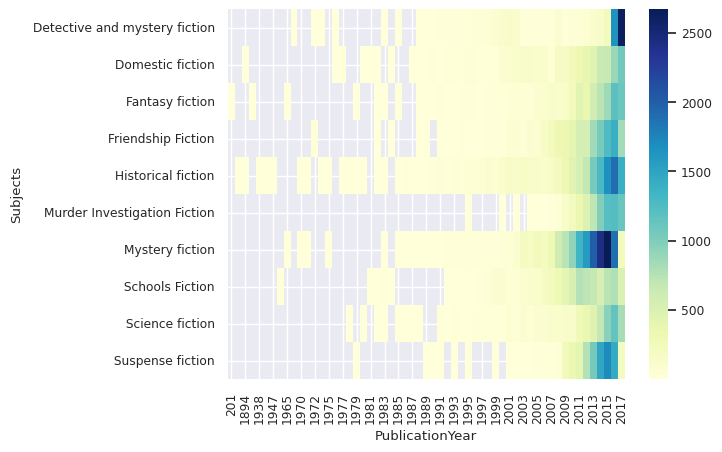

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

top_subjects_bibnums = subject_df[subject_df['Subjects'].isin(top_subjects.index)]

# Create a heatmap using Seaborn
heatmap_data = pd.pivot_table(top_subjects_bibnums, values='BibNum', index='Subjects', columns='PublicationYear', aggfunc='count')
sns.set(font_scale=0.8)
sns.heatmap(heatmap_data, cmap="YlGnBu")
plt.show()

**Question 3:** Using Vaex, write a function that gets as input a subject name. The function returns the top-20 most _popular_ authors for the input subject (15pt).



In [18]:
def top_20_popular_authors(subject,df):
    # drop the rows with NaN values in the 'Subjects' column
    cleaned = df[df['Subjects'].notna()]
    print("cleaned " +str(cleaned.shape))

    # split the 'Subjects' column into a list of strings
    cleaned['Subjects'] = cleaned['Subjects'].str.split(',')

    # Convert the Vaex DataFrame to a Pandas DataFrame
    pandas_df = cleaned.to_pandas_df()

    # explode the 'Subjects' column into separate rows
    splitted = pandas_df.explode('Subjects')
    print("splitted " + str(splitted.shape))

    # Filter the DataFrame to keep only rows that have the specified subject in the Subjects column
    subject_df = splitted[splitted['Subjects'].apply(lambda x: (x is not None) and (subject in x))]
    print("filtered" +str(subject_df.shape))

    # Group the split DataFrame by authors and count the number of occurrences
    grouped_df = subject_df.groupby('Author').agg({'BibNum': 'sum'})

    sorted_df = grouped_df.sort_values(by='BibNum', ascending=False)

    # Select the top 10 subjects
    return sorted_df[:20]



top20 = top_20_popular_authors('Mystery fiction',df)
print(top20)

cleaned (975492, 13)
splitted (3912418, 13)
filtered(27211, 13)
                                       BibNum
Author                                       
Patterson, James, 1947-            1423322524
Christie, Agatha, 1890-1976        1032196841
Jance, Judith A.                    756892109
Woods, Stuart                       715092214
Robb, J. D., 1950-                  678455776
McCall Smith, Alexander, 1948-      655996140
Perry, Anne                         645845716
Evanovich, Janet                    627606098
Beaton, M. C.                       592647548
Sandford, John, 1944 February 23-   573293435
Connelly, Michael, 1956-            479802793
Penny, Louise                       453933997
Parker, Robert B., 1932-2010        444625352
King, Laurie R.                     427044262
Cornwell, Patricia Daniels          410418121
Grafton, Sue                        405587912
Reichs, Kathy                       399667223
Clark, Mary Higgins                 395949249
Leon, Donna     

Using the [The Blog Authorship Corpus](https://www.kaggle.com/rtatman/blog-authorship-corpus.htm) and Vaex, please answer the following questions:

**Question 4:** Calculate the average and median age of bloggers in each topic by gender(5pt). 
Calculate the average and median age of bloggers according to their sign (5pt). 
Visualize the age distributions  of bloggers according to their  topic and gender using Seaborn and PlotlyExpress(15pt)

setup

In [19]:
# Creating a dataset directory

#!mkdir ./datasets
!mkdir ./datasets/blog-authorship-corpus


# download the dataset from Kaggle and unzip it
!kaggle datasets download rtatman/blog-authorship-corpus  -p ./datasets/blog-authorship-corpus
!unzip ./datasets/blog-authorship-corpus/*.zip  -d ./datasets/blog-authorship-corpus
!ls ./datasets/blog-authorship-corpus


 93% 269M/290M [00:04<00:00, 85.5MB/s]
100% 290M/290M [00:04<00:00, 72.7MB/s]
Archive:  ./datasets/blog-authorship-corpus/blog-authorship-corpus.zip
  inflating: ./datasets/blog-authorship-corpus/blogtext.csv  
blog-authorship-corpus.zip  blogtext.csv


In [20]:
import vaex
df = vaex.read_csv("./datasets/blog-authorship-corpus/blogtext.csv", convert=True, progress=True,nrows= rows)
df.head(3)

Converting csv to chunk files
Saved chunk #0 to ./datasets/blog-authorship-corpus/blogtext.csv_chunk_0.hdf5


#,id,gender,age,topic,sign,date,text
0,2059027,male,15,Student,Leo,"14,May,2004","' Info has been found (+/- 100 pages, ..."
1,2059027,male,15,Student,Leo,"13,May,2004",' These are the team members: Drewes...
2,2059027,male,15,Student,Leo,"12,May,2004",' In het kader van kernfusie op aarde:...


In [24]:
df.column_names

['id', 'gender', 'age', 'topic', 'sign', 'date', 'text']

# Calculate the average age of bloggers in each topic by gender


In [41]:
grouped_df =  df.groupby(['topic', 'gender'])
grouped_df.agg({'age': 'mean'})

#,topic,gender,age
0,Military,female,23.717005076142133
1,Military,male,26.836324786324788
2,RealEstate,female,25.811292719167906
3,RealEstate,male,27.221128608923884
4,Banking,female,27.49173553719008
...,...,...,...
75,Marketing,male,29.697704918032787
76,Arts,female,25.50335145405605
77,Arts,male,24.611687157458153
78,InvestmentBanking,female,25.20728929384966


# Calculate the median age of bloggers in each topic by gender



In [42]:
df.to_pandas_df().groupby(['topic', 'gender'])['age'].median()

topic           gender
Accounting      female    26.0
                male      23.0
Advertising     female    23.0
                male      26.0
Agriculture     female    24.0
                          ... 
Tourism         male      25.0
Transportation  female    35.0
                male      34.0
indUnk          female    24.0
                male      24.0
Name: age, Length: 80, dtype: float64

#Calculate the average  age of bloggers according to their sign


In [43]:
grouped_df =  df.groupby(['topic', 'sign'])
grouped_df.agg({'age': 'mean'})

#,topic,sign,age
0,Military,Cancer,23.107843137254903
1,Military,Aquarius,28.41329479768786
2,Military,Capricorn,31.31756756756757
3,Military,Gemini,27.71345029239766
4,Military,Virgo,27.738805970149254
...,...,...,...
469,InvestmentBanking,Sagittarius,22.01775147928994
470,InvestmentBanking,Scorpio,36.62433862433863
471,InvestmentBanking,Pisces,25.0
472,InvestmentBanking,Leo,24.181451612903224


#Calculate the median age of bloggers according to their sign


In [44]:
df.to_pandas_df().groupby(['topic', 'sign'])['age'].median()

topic       sign       
Accounting  Aquarius       24.0
            Aries          23.0
            Cancer         23.0
            Capricorn      25.0
            Gemini         17.0
                           ... 
indUnk      Pisces         25.0
            Sagittarius    24.0
            Scorpio        23.0
            Taurus         24.0
            Virgo          25.0
Name: age, Length: 474, dtype: float64

#Visualize the age distributions of bloggers according to their topic and gender using Seaborn 


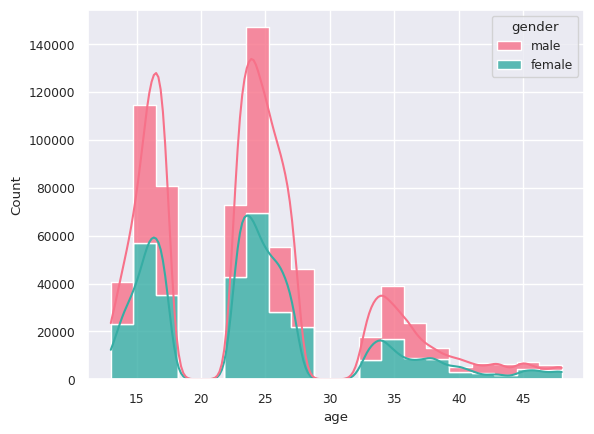

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt
# Create a seaborn histogram for each topic and gender
sns.histplot(data=df.to_pandas_df(), x='age', hue='gender', multiple='stack', bins=20, kde=True, element='step', alpha=0.8, palette='husl', label='topic')

# Show the plots
plt.show()


#Visualize the age distributions of bloggers according to their topic and gender using  PlotlyExpress

In [63]:
import plotly.express as px

fig = px.violin(df.to_pandas_df(), x="topic", y="age", color="gender", box=True, points="all", hover_data=["id"], title="Age Distribution by Topic and Gender")
fig.update_layout(xaxis_title="Topic", yaxis_title="Age", legend_title="Gender")
fig.show()


**Question 5:** Using the  [SJR Journal Ranking of 2018](https://www.scimagojr.com/journalrank.php) dataset and Seaborn, visualize
    the H-index distributions according to the SJR Best Quartile (15pt). Using a grid, visualize the _Cites / Doc. (2years)_ histograms values of each publisher (15pt).
    


In [64]:
!mkdir ./datasets/sjr/
!wget -O ./datasets/sjr/sjr.csv https://www.scimagojr.com/journalrank.php?out=xls 

--2023-04-16 13:50:38--  https://www.scimagojr.com/journalrank.php?out=xls
Resolving www.scimagojr.com (www.scimagojr.com)... 94.130.25.5
Connecting to www.scimagojr.com (www.scimagojr.com)|94.130.25.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘./datasets/sjr/sjr.csv’

./datasets/sjr/sjr.     [      <=>           ]   7.76M  7.64MB/s    in 1.0s    

2023-04-16 13:50:42 (7.64 MB/s) - ‘./datasets/sjr/sjr.csv’ saved [8136262]



In [74]:
import vaex
import seaborn as sns
df = vaex.read_csv("./datasets/sjr/sjr.csv", delimiter=";",nrows= 10000)
df.head(3)

#,Rank,Sourceid,Title,Type,Issn,SJR,SJR Best Quartile,H index,Total Docs. (2021),Total Docs. (3years),Total Refs.,Total Cites (3years),Citable Docs. (3years),Cites / Doc. (2years),Ref. / Doc.,Country,Region,Publisher,Coverage,Categories,Areas
0,1,28773,Ca-A Cancer Journal for Clinicians,journal,"15424863, 00079235","56,204",Q1,182,41,121,4006,17959,78,"186,75","97,71",United States,Northern America,Wiley-Blackwell,1950-2021,Hematology (Q1); Oncology (Q1),Medicine
1,2,20315,Nature Reviews Molecular Cell Biology,journal,"14710072, 14710080","33,213",Q1,452,111,338,9025,13797,161,"38,55","81,31",United Kingdom,Western Europe,Nature Publishing Group,2000-2021,Cell Biology (Q1); Molecular Biology (Q1),"Biochemistry, Genetics and Molecular Biology"
2,3,29431,Quarterly Journal of Economics,journal,"00335533, 15314650","31,348",Q1,272,48,111,3406,2241,110,"16,30","70,96",United Kingdom,Western Europe,Oxford University Press,1886-2021,Economics and Econometrics (Q1),"Economics, Econometrics and Finance"


In [67]:
df.column_names

['Rank',
 'Sourceid',
 'Title',
 'Type',
 'Issn',
 'SJR',
 'SJR Best Quartile',
 'H index',
 'Total Docs. (2021)',
 'Total Docs. (3years)',
 'Total Refs.',
 'Total Cites (3years)',
 'Citable Docs. (3years)',
 'Cites / Doc. (2years)',
 'Ref. / Doc.',
 'Country',
 'Region',
 'Publisher',
 'Coverage',
 'Categories',
 'Areas']

#use  Seaborn, visualize the H-index distributions according to the SJR Best Quartile

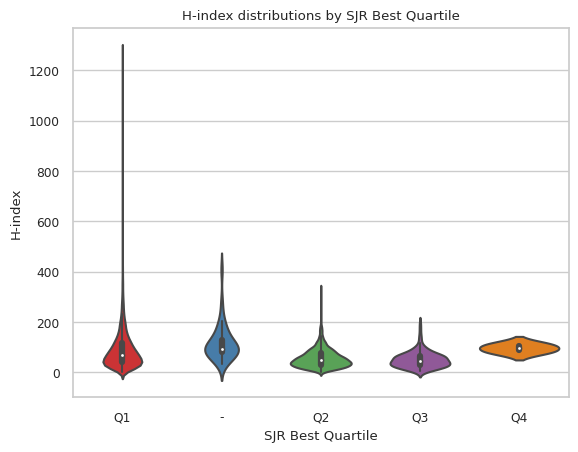

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
sns.set_palette("Set1")

# Visualize the distributions using violin plots
sns.violinplot(x='SJR Best Quartile', y='H index', data=df.to_pandas_df())
plt.title('H-index distributions by SJR Best Quartile')
plt.xlabel('SJR Best Quartile')
plt.ylabel('H-index')
plt.show()

# Using a grid, visualize the Cites / Doc. (2years) histograms values of each publisher

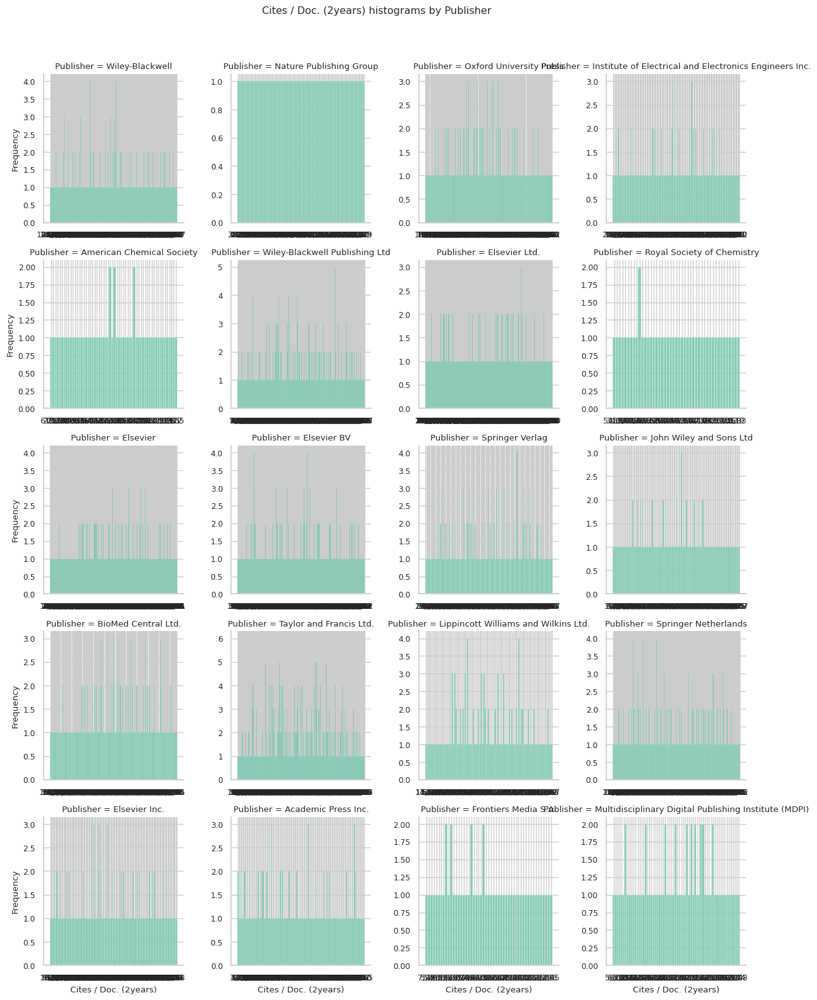

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
sns.set_palette("Set2")
df = df.to_pandas_df()
# Filter the data to only include publishers with the highest number of documents
top_publishers = df.groupby('Publisher')['Total Docs. (3years)'].sum().sort_values(ascending=False).head(20).index
df_filtered = df[df['Publisher'].isin(top_publishers)]

# Create a grid of histograms using FacetGrid
g = sns.FacetGrid(df_filtered, col='Publisher', col_wrap=4, sharex=False, sharey=False)
g.map(sns.histplot, 'Cites / Doc. (2years)', bins=10)
g.set_axis_labels('Cites / Doc. (2years)', 'Frequency')
g.fig.suptitle('Cites / Doc. (2years) histograms by Publisher', y=1.05)

plt.show()